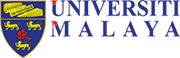

**WQD7006: MACHINE LEARNING FOR DATA SCIENCE**

**Semester 1, Session 2021/2022**

**Lecturer: Dr Woo Chaw Seng**

**Student Name: Nazrah Mustapa**

**Student ID: 17218099**


---


**ProjectTitle:	Geographical analysis in Covid-19 vaccination using geospatial analysis of US country**

Data Source:	

1.   https://www.kaggle.com/peretzcohen/2019-census-us-population-data-by-state
2.   https://raw.githubusercontent.com/owid/covid-19-data/master/public/data/vaccinations/us_state_vaccinations.csv



**Objective 1:** 
To determine which locations should the Covid-19 vaccination campaign expands its reach in remote areas in US as to get more its citizens vaccinated using variety of machine learning models.



**Objective 2:** 
To justify that geography contributes to the achievement of Covid-19 vaccination campaigns.







---



**Assignment step3**


1. Start the coding/programming part using the software tools selected. Try to include the passport photo that had submitted.

2. Document the program codes with comments.

3. Store the experiment results as pictures or images. 

4. Consider deposit working sheet in GitHub. See: https://github.com/nazrah-ai/WQD7006_ML-FOR-DATA-SCIENCE.git

5. Submit a written report in Spectrum within 1 week. The report should contain samples of input images and output images. Input images are the dataset pictures of Assignment step1. Output images are the experiment results mentioned in step3 above. Report can be a PDF file or MS Word file from 2 to 6 pages in length within 20MB filesize.



---



**The passport photo that had submitted during Lab week 2 as below:-**

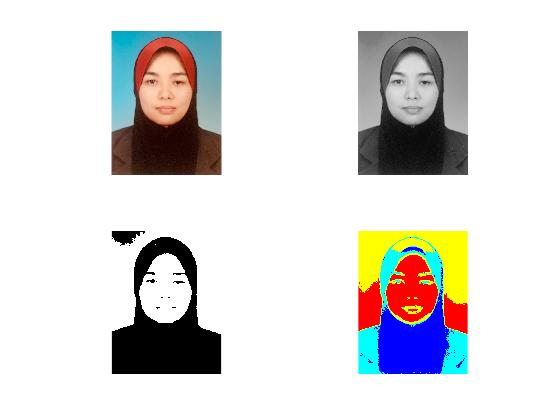

# **Reading data**

The first step is to read in the geospatial data using the GeoPandas library.

In [2]:
!pip install geopandas
import geopandas
import geopandas as gpd


     |████████████████████████████████| 1.0 MB 7.9 MB/s 
     |████████████████████████████████| 6.3 MB 47.4 MB/s 
     |████████████████████████████████| 15.4 MB 19.7 MB/s 


**The next code cell loads a shapefile from the place I put namely Google Drive containing information about the datasets.**

In [3]:
#Import the data
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


**It is important to have a check if the file exist in Google Drive where the datasets are placed.**

In [4]:
#to check if the file exist
import os
os.chdir("/content/drive/My Drive/Colab Notebooks")
!ls

'2019 Census US Population Data By State _ Kaggle.html'
'Copy of ggplot2-workshop [SC].ipynb'
'Copy of R_PreConf_Intro to Linear Regression.ipynb'
'Copy of WQD7006_GEOSPATIAL ANALYSIS.ipynb'
'Copy of WQD7006_LAB3_PorterStemmer.ipynb'
 data
'Day 2.ipynb'
 Hadoop_install
 hadoop_install.ipynb
'Lab 2_Group.ipynb'
 map_reduce.ipynb
 MyFirstColabNotebook.ipynb
'R_PreConf_Intro to Linear Regression.ipynb'
 Untitled0.ipynb
 Untitled1.ipynb
 vaccinationAndPopulationByLocation.csv
 WQD7006_2019_Census_US_Population_Data_By_State_Lat_Long.csv
 WQD7006_2019_Census_US_Vaccine.csv
'WQD7006_Assignment Step 2.ipynb'
'WQD7006_Assignment Step 3.ipynb'
'WQD7006_GEOSPATIAL ANALYSIS.ipynb'
 WQD7006_LAB3_PorterStemmer.ipynb
 WQD7006_LAB3_SearchEngine.ipynb
 WQD7006_TESTING_KAGGLE.ipynb


# **I use two datasets.**


---
The first dataset has the total number of inhabitants of each state, along with latitude and longitude data for each state's capital city. This dataset is pulled from the 2019 US Census, and I've uploaded it here.

The second dataset contains a recent estimate for the total number of people that have been vaccinated in each state. This vaccine dataset is drawn from Our World In Data, who update their vaccine datasets from the CDC quite regularly. 




In [5]:
data_vac = open(r"/content/drive/My Drive/Colab Notebooks/WQD7006_2019_Census_US_Vaccine.csv")

In [6]:
data_population = open(r"/content/drive/My Drive/Colab Notebooks/WQD7006_2019_Census_US_Population_Data_By_State_Lat_Long.csv")

**It is important to install some Python packages so as to ensure I can run Python from the command line.**

In [7]:
# Install the python packages
import pandas as pd
from datetime import date, timedelta
import folium
from folium import Marker
from folium.plugins import MarkerCluster
import math
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import sys 

**Reading the 1st dataset namely population and location data and get the most recent date for filtering.**


In [15]:
##READ IN THE DATA
#Population Data according to Location using Latitude and Longitude as measurement
populationData = pd.read_csv(r"/content/drive/My Drive/Colab Notebooks/WQD7006_2019_Census_US_Population_Data_By_State_Lat_Long.csv")
print(populationData)

# Get the most recent date for filtering
freshDate = date.today() - timedelta(days=1)
freshDate = date.strftime(freshDate,"%Y%m%d")
freshDate = freshDate[0:4] + "-" + freshDate[4:6] + "-" + freshDate[6:8]


                   STATE  POPESTIMATE2019        lat        long
0                Alabama          4903185  32.377716  -86.300568
1                 Alaska           731545  58.301598 -134.420212
2                Arizona          7278717  33.448143 -112.096962
3               Arkansas          3017804  34.746613  -92.288986
4             California         39512223  38.576668 -121.493629
5               Colorado          5758736  39.739227 -104.984856
6            Connecticut          3565287  41.764046  -72.682198
7               Delaware           973764  39.157307  -75.519722
8   District of Columbia           705749  38.895110  -77.036370
9                Florida         21477737  30.438118  -84.281296
10               Georgia         10617423  33.749027  -84.388229
11                Hawaii          1415872  21.307442 -157.857376
12                 Idaho          1787065  43.617775 -116.199722
13              Illinois         12671821  39.798363  -89.654961
14               Indiana 

In [16]:
# View the first five rows of the data
populationData.head()

,STATE,POPESTIMATE2019,lat,long
0,Alabama,4903185,32.377716,-86.300568
1,Alaska,731545,58.301598,-134.420212
2,Arizona,7278717,33.448143,-112.096962
3,Arkansas,3017804,34.746613,-92.288986
4,California,39512223,38.576668,-121.493629


**Reading the 2nd dataset namely vaccination data according to state in US and get the most recent date for filtering.**

In [9]:
# Vaccination data, for most recent date
vaccinationData = pd.read_csv(r"/content/drive/My Drive/Colab Notebooks/WQD7006_2019_Census_US_Vaccine.csv")
print(vaccinationData)

             date location  ...  daily_vaccinations_per_million  share_doses_used
0      2021-01-12  Alabama  ...                             NaN             0.207
1      2021-01-13  Alabama  ...                          1205.0             0.222
2      2021-01-14  Alabama  ...                          1445.0             0.212
3      2021-01-15  Alabama  ...                          1525.0             0.226
4      2021-01-16  Alabama  ...                          1529.0               NaN
...           ...      ...  ...                             ...               ...
19610  2021-11-13  Wyoming  ...                          3796.0             0.755
19611  2021-11-14  Wyoming  ...                          3827.0             0.756
19612  2021-11-15  Wyoming  ...                          3843.0             0.756
19613  2021-11-16  Wyoming  ...                          3915.0             0.762
19614  2021-11-17  Wyoming  ...                          3464.0             0.761

[19615 rows x 1

**In the next code cell, I load and preprocess the data. As output, it shows the total percent of the population that has been vaccinated in the US (the most latest date; 12 December 2021), along with a preview of the Pandas DataFrame that use to make the tracker.**


In [17]:
print("Date ran:", date.today())

# Calculate the total percent vaccinated in the US
percentageTotal = vaccinationAndPopulationByLocation["people_vaccinated"].sum() / vaccinationAndPopulationByLocation["POPESTIMATE2019"].sum()
print('Percentage Vaccinated in the US: {}%'.format(round(percentageTotal*100, 2))) 

Date ran: 2021-12-12
Percentage Vaccinated in the US: 42.48%


**The next code shows the combination of two datasets namely Vaccination and Population data by Location. The combination of the two datasets is important so as to tally back with the purpose of this machine Leaning project as outlined in the objective.**

In [11]:
# Vaccination and population data
vaccinationAndPopulationByLocation = pd.merge(populationData, vaccinationData, left_on='STATE',right_on='location').drop(columns="location")
vaccinationAndPopulationByLocation

,STATE,POPESTIMATE2019,lat,long,date,total_vaccinations,total_distributed,people_vaccinated,people_fully_vaccinated_per_hundred,total_vaccinations_per_hundred,people_fully_vaccinated,people_vaccinated_per_hundred,distributed_per_hundred,daily_vaccinations_raw,daily_vaccinations,daily_vaccinations_per_million,share_doses_used
0,Alabama,4903185,32.377716,-86.300568,2021-01-12,78134.0,377025.0,70861.0,0.15,1.59,7270.0,1.45,7.69,NaN,NaN,NaN,0.207
1,Alabama,4903185,32.377716,-86.300568,2021-01-13,84040.0,378975.0,74792.0,0.19,1.71,9245.0,1.53,7.73,5906.0,5906.0,1205.0,0.222
2,Alabama,4903185,32.377716,-86.300568,2021-01-14,92300.0,435350.0,80480.0,NaN,1.88,NaN,1.64,8.88,8260.0,7083.0,1445.0,0.212
3,Alabama,4903185,32.377716,-86.300568,2021-01-15,100567.0,444650.0,86956.0,0.28,2.05,13488.0,1.77,9.07,8267.0,7478.0,1525.0,0.226
4,Alabama,4903185,32.377716,-86.300568,2021-01-16,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,7498.0,1529.0,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15052,Wyoming,578759,41.140259,-104.820236,2021-11-13,603127.0,798935.0,301361.0,44.78,104.21,259167.0,52.07,138.04,4420.0,2197.0,3796.0,0.755
15053,Wyoming,578759,41.140259,-104.820236,2021-11-14,603401.0,798655.0,301596.0,44.79,104.26,259223.0,52.11,137.99,274.0,2215.0,3827.0,0.756
15054,Wyoming,578759,41.140259,-104.820236,2021-11-15,603509.0,798655.0,301660.0,44.79,104.28,259238.0,52.12,137.99,108.0,2224.0,3843.0,0.756
15055,Wyoming,578759,41.140259,-104.820236,2021-11-16,609472.0,799955.0,303553.0,44.97,105.31,260286.0,52.45,138.22,5963.0,2266.0,3915.0,0.762


# **1st MAP**


**Visualize the above combined data with the plot() method.**

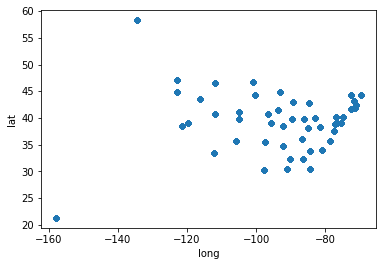

In [12]:
vaccinationAndPopulationByLocation.plot(kind="scatter", x="long", y="lat", alpha=0.1)

**As to in line with the objective of this project, count the percentage vaccinated in US state.**

In [21]:
# Calculate percentage vaccinated by state
vaccinationAndPopulationByLocation["percent_vaccinated"] = vaccinationAndPopulationByLocation["people_vaccinated"] / vaccinationAndPopulationByLocation["POPESTIMATE2019"]
vaccinationAndPopulationByLocation


,STATE,POPESTIMATE2019,lat,long,date,total_vaccinations,total_distributed,people_vaccinated,people_fully_vaccinated_per_hundred,total_vaccinations_per_hundred,people_fully_vaccinated,people_vaccinated_per_hundred,distributed_per_hundred,daily_vaccinations_raw,daily_vaccinations,daily_vaccinations_per_million,share_doses_used,percent_vaccinated
0,Alabama,4903185,32.377716,-86.300568,2021-01-12,78134.0,377025.0,70861.0,0.15,1.59,7270.0,1.45,7.69,NaN,NaN,NaN,0.207,0.014452
1,Alabama,4903185,32.377716,-86.300568,2021-01-13,84040.0,378975.0,74792.0,0.19,1.71,9245.0,1.53,7.73,5906.0,5906.0,1205.0,0.222,0.015254
2,Alabama,4903185,32.377716,-86.300568,2021-01-14,92300.0,435350.0,80480.0,NaN,1.88,NaN,1.64,8.88,8260.0,7083.0,1445.0,0.212,0.016414
3,Alabama,4903185,32.377716,-86.300568,2021-01-15,100567.0,444650.0,86956.0,0.28,2.05,13488.0,1.77,9.07,8267.0,7478.0,1525.0,0.226,0.017735
4,Alabama,4903185,32.377716,-86.300568,2021-01-16,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,7498.0,1529.0,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15052,Wyoming,578759,41.140259,-104.820236,2021-11-13,603127.0,798935.0,301361.0,44.78,104.21,259167.0,52.07,138.04,4420.0,2197.0,3796.0,0.755,0.520702
15053,Wyoming,578759,41.140259,-104.820236,2021-11-14,603401.0,798655.0,301596.0,44.79,104.26,259223.0,52.11,137.99,274.0,2215.0,3827.0,0.756,0.521108
15054,Wyoming,578759,41.140259,-104.820236,2021-11-15,603509.0,798655.0,301660.0,44.79,104.28,259238.0,52.12,137.99,108.0,2224.0,3843.0,0.756,0.521219
15055,Wyoming,578759,41.140259,-104.820236,2021-11-16,609472.0,799955.0,303553.0,44.97,105.31,260286.0,52.45,138.22,5963.0,2266.0,3915.0,0.762,0.524489


# **2nd MAP**

**The next code cell uses the above data to create a tracker, with one marker for each state. By clicking on the markers to see the percentage of the population that has been vaccinated as at the latest date the code was run; 12 December 2021**. 


In [24]:
# Create the map
v_map = folium.Map(location=[42.32,-71.0589], tiles='cartodbpositron', zoom_start=4) 

# Add points to the map
mc = MarkerCluster()
for idx, row in vaccinationAndPopulationByLocation.iterrows(): 
    if not math.isnan(row['long']) and not math.isnan(row['lat']):
        mc.add_child(Marker(location=[row['lat'], row['long']],
                            tooltip=str(round(row['percent_vaccinated']*100, 2))+"%"))
v_map.add_child(mc)

# Display the map
v_map